# Data Science Minneapolis: Intro to TensorFlow 2

What is this workshop about?

1. The three APIs of TensorFlow 2
2. Airbnb price regressions
3. Getting insights from gradients

### How to run the notebook?

* The notebook can be run on Google Colab or a Jupyter Notebook 
* https://github.com/yaniv256/workshops/blob/master/notebooks/TF2-intro-Airbnb.ipynb
* Or web search Colab, go to the `Github` tab, enter `yaniv256`, pick the `workshops` repository, and pick the `TF2-intro-Airbnb.ipynb` notebook.

## Why TensorFlow 2?

TF2: "We will add your biological and technological distinctiveness to our own... Resistance is futile."
* Freely copied the best of PyTorch
* Keras was assimilated
* TF2 is still more popular (according to [Google trends](https://trends.google.com/trends/explore?date=today%205-y&geo=US&q=TensorFlow,PyTorch,Keras))

![](https://upload.wikimedia.org/wikipedia/en/a/a1/Picard_as_Locutus.jpg)

## The three APIs

1. Sequencial: when all you need is a stack of layers
2. Functional: when you want to connect layers in whatever way
3. Subclassing: Object Oriented + connect on input

And there's also TensorFlow itself - good for any symbolic computation.

### Example: Sequencial API

In [1]:
import tensorflow.keras as keras

def build_model_sequential(input_shape, activation='relu', width=128):

    model = keras.Sequential()
    model.add(keras.layers.Dense(width, activation=activation,
                                 input_shape=input_shape))
    model.add(keras.layers.Dense(width, activation=activation))
    model.add(keras.layers.Dense(1))

    return model

build_model_sequential((15,))

### Example: Functional API

In [2]:
import tensorflow.keras as keras

def build_model_functional(input_shape, activation='relu', width=128):

    inputs = keras.Input(shape=input_shape)
    x = keras.layers.Dense(width, activation=activation)(inputs)
    x = keras.layers.Dense(width, activation=activation)(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)

    return model

build_model_functional((15,))

### Example: Subclassing API

In [3]:
def build_model_subclassing(activation='relu', width=128):

    class MyModel(keras.Model):
        def __init__(self):
            super(MyModel, self).__init__()
            self.dense1 = keras.layers.Dense(width, activation=activation)
            self.dense2 = keras.layers.Dense(width, activation=activation)
            self.out = keras.layers.Dense(1)

        def call(self, x):
            x = self.dense1(x)
            x = self.dense2(x)
            return self.out(x)

    model = MyModel()

    return model

build_model_subclassing()

<__main__.build_model_subclassing.<locals>.MyModel at 0x6406d9510>

### Which API should you learn?

* Sequencial is good enough for most tasks
* Same code in Functional is just as short and no less clear

* If you want to build reusable objects, go for Subclassing
* Otherwise, Functional is as powerful and more readable

## Airbnb price regressions

* Predict a listings price based on its features
* Valuate listings
* Valuate locations

## Valuation vs. prediction

* Making a best prediction isn't the same as estimating value
* Many listings are overpriced
* Lots of reviews indicate price is low relative to listing value

## Insight from gradients

* What is the sensitivity of a prediction to each input?
* Which variables are most important?
* How to examine non-linearities and interactions?

Answers to all: gradients.

# InsideAirbnb data

Data source: http://insideairbnb.com/index.html

* Local interest everywhere
* Up to date
* Time series, images, NLP (not today, though)

## Load Twin Cities data

In [4]:
%%writefile airbnbloader.py
from collections import OrderedDict
import pandas as pd
from datetime import datetime
import numpy as np


def load(date='2019-06-02', location='united-states/mn/twin-cities-msa'):

    filename = (
        'http://data.insideairbnb.com/{}/{}/data/listings.csv.gz'.format(
            location, date))

    data = pd.read_csv(filename)

    data.price = data.price.apply(lambda x: float(x[1:].replace(',', '')))

    weekday = data.last_review.dropna().apply(
      lambda x: datetime.strptime(x, '%Y-%m-%d').strftime('%A'))
    weekday.name = 'last_review_weekday'
    data = data.join(weekday)

    days_since_last_review = data.last_review.dropna().apply(
        lambda x: (datetime.strptime(date, '%Y-%m-%d')
                   - datetime.strptime(x, '%Y-%m-%d')).days)
    days_since_last_review.name = 'days_since_last_review'
    data = data.join(days_since_last_review)

    features = data[[
        'price',
        'latitude',
        'longitude',
        'room_type',
        'accommodates',
        'bathrooms',
        'bedrooms',
        'beds',
        'minimum_nights',
        'days_since_last_review',
        'number_of_reviews',
        'reviews_per_month',
        'calculated_host_listings_count',
        'availability_30',
        'availability_365'
        ]]

    features.dropna(inplace=True)
    features = features[features.availability_365 != 0]
    features = features[features.availability_365 != 365]

    onehot_room_type = pd.get_dummies(features['room_type'])

    onehot_room_type.drop(['Private room'], axis=1, inplace=True)

    features = pd.concat([features, onehot_room_type], axis=1)

    targets = features['price'].apply(lambda x: np.log(x+1))

    features.drop(['price', 'room_type'], axis=1, inplace=True)

    return features, targets, data


def all_value_counts(data, n=5):

    return OrderedDict(
        (field,
         dict(n=len(set(data[field])),
              top=list(zip(
                  data[field].value_counts().head(n).index,
                  data[field].value_counts().head(n).values))))
        for field in data.columns)

Overwriting airbnbloader.py


Some dates that are available for `location='united-states/mn/twin-cities-msa':`
* Last June: date='2019-05-05'
* Last January: date='2020-01-04'
* Most recent: date='2020-05-12'

In [5]:
import importlib
import warnings
import airbnbloader

warnings.filterwarnings('ignore')

features, targets, data = airbnbloader.load(
    location='united-states/mn/twin-cities-msa',
    date='2020-05-12'
)

features.shape, targets.shape, data.shape

((2885, 16), (2885,), (6617, 108))

In [6]:
features.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Hotel room,Shared room
0,45.00886,-93.23407,5,1.0,1.0,1.0,1,58.0,233,1.81,2,4,153,1,0,0
1,44.94566,-93.35721,5,1.0,2.0,2.0,2,56.0,166,1.37,1,27,362,0,0,0
2,44.91878,-93.23038,3,1.0,2.0,2.0,2,149.0,174,1.49,2,29,362,0,0,0
3,44.91985,-93.35141,3,1.5,1.0,1.0,2,132.0,32,0.33,2,11,312,1,0,0
4,44.94800,-93.19037,4,1.0,1.0,2.0,3,1374.0,20,0.19,1,0,254,1,0,0


Split to train and test data sets.

In [7]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    features,
    targets,
    test_size=0.25,
    random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2163, 16), (722, 16), (2163,), (722,))

## Map listings

In [8]:
%%writefile mapairbnb.py
import plotly.graph_objects as go


def plot(data, features, color_by, color_title, zoom=10, hover=True,
         center=dict(lat=44.981944, lon=-93.269167)):

    data_ = data.loc[features.index]

    if hover:
        text = [
            '{}  <br> ${}'.format(data_.name[i], data_.price[i])
            + '<br>Number of reviews: {}<br>'.format(
                data_.number_of_reviews[i])
            + ' <a href="{}">link</a>'.format(
                data_.listing_url[i])
            + '<br>Availability: {}'.format(data_.availability_365[i])
            + '<br>Days since last review: {}'.format(
                features.days_since_last_review[i])
            + '<br>Accommodates: {}'.format(features.accommodates[i])
            for i in data_.index]
    else:
        text = ''

    fig = go.Figure(go.Scattermapbox(
        lat=features.latitude,
        lon=features.longitude,
        mode='markers',
        text=text,
        hoverinfo='text',
        marker=dict(color=color_by, colorscale='rainbow',
                    colorbar=dict(title=color_title), size=9),
        ))

    fig.update_layout(
        hovermode='x',
        hoverdistance=20,
        mapbox_style='white-bg',
        autosize=False,
        width=900,
        height=400,
        mapbox_layers=[{
            'below': 'traces', 'sourcetype': 'raster',
            'source': ['https://basemap.nationalmap.gov/arcgis/rest/services/'
                       + 'USGSImageryOnly/MapServer/tile/{z}/{y}/{x}']}],
        mapbox=dict(bearing=0, center=center, pitch=0, zoom=zoom),
        )

    fig.update_layout(margin={'r': 0, 't': 0, 'l': 0, 'b': 0})

    return fig

Overwriting mapairbnb.py


In [9]:
import mapairbnb

mapairbnb.plot(data, features, color_by=targets, color_title='Log price')

# OLS Regression
Let's run an OLS regression as a benchmark

In [10]:
import statsmodels.api as sm
import pandas as pd

X_train_with_const = sm.add_constant(
    pd.DataFrame(X_train, columns=features.columns))
X_test_with_const = sm.add_constant(
    pd.DataFrame(X_test, columns=features.columns))

results = sm.OLS(y_train, X_train_with_const).fit(cov_type='HC0')

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.629
Model:                            OLS   Adj. R-squared:                  0.627
Method:                 Least Squares   F-statistic:                     247.2
Date:                Tue, 19 May 2020   Prob (F-statistic):               0.00
Time:                        18:57:57   Log-Likelihood:                -1691.5
No. Observations:                2163   AIC:                             3417.
Df Residuals:                    2146   BIC:                             3514.
Df Model:                          16                                         
Covariance Type:                  HC0                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

## Valuate listings

* Lots of reviews indicate lower prices relative to the value
* We need to fix the review variables on some constant
* Let's use the median

In [11]:
%%writefile fixcolumns.py
import numpy as np
import pandas as pd


def fix(data, fix_columns, fix_on):

    all_fixed = pd.DataFrame(
        np.tile(fix_on, (len(data), 1)),
        columns=data.columns)

    all_fixed.index = data.index

    fixed_data = data.copy()

    fixed_data[fix_columns] = all_fixed[fix_columns]

    return fixed_data


Overwriting fixcolumns.py


In [12]:
import fixcolumns

fix_reviews = fixcolumns.fix(
    data=features,
    fix_columns=[
        'days_since_last_review',
        'number_of_reviews',
        'reviews_per_month'],
    fix_on=features.median().values
    )

fix_reviews.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Hotel room,Shared room
0,45.00886,-93.23407,5,1.0,1.0,1.0,1,79.0,20.0,1.16,2,4,153,1,0,0
1,44.94566,-93.35721,5,1.0,2.0,2.0,2,79.0,20.0,1.16,1,27,362,0,0,0
2,44.91878,-93.23038,3,1.0,2.0,2.0,2,79.0,20.0,1.16,2,29,362,0,0,0
3,44.91985,-93.35141,3,1.5,1.0,1.0,2,79.0,20.0,1.16,2,11,312,1,0,0
4,44.94800,-93.19037,4,1.0,1.0,2.0,3,79.0,20.0,1.16,1,0,254,1,0,0


Now we can use the review-constant listings to estimate the "right" price for listings and compare that to what it is listed for. 

In [13]:
ols_predicted = results.predict(
    sm.add_constant(fix_reviews, has_constant='add'))
overpriced = targets-ols_predicted
mapairbnb.plot(
    data, features, color_by=overpriced, color_title='Diff log price')

## Location, location, location!

* To see the effect of location we need to hold everything else fixed. 

In [14]:
location_only = fixcolumns.fix(
    data=features,
    fix_columns=features.columns[2:],
    fix_on=features.median().values
    )

location_only.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Hotel room,Shared room
0,45.00886,-93.23407,4.0,1.0,1.0,2.0,2.0,79.0,20.0,1.16,2.0,13.0,179.0,1.0,0.0,0.0
1,44.94566,-93.35721,4.0,1.0,1.0,2.0,2.0,79.0,20.0,1.16,2.0,13.0,179.0,1.0,0.0,0.0
2,44.91878,-93.23038,4.0,1.0,1.0,2.0,2.0,79.0,20.0,1.16,2.0,13.0,179.0,1.0,0.0,0.0
3,44.91985,-93.35141,4.0,1.0,1.0,2.0,2.0,79.0,20.0,1.16,2.0,13.0,179.0,1.0,0.0,0.0
4,44.94800,-93.19037,4.0,1.0,1.0,2.0,2.0,79.0,20.0,1.16,2.0,13.0,179.0,1.0,0.0,0.0


Fixing all but location we can map the value of a location.

In [15]:
import numpy as np

location_predicted = results.predict(
    sm.add_constant(location_only, has_constant='add'))

mapairbnb.plot(data, features, color_by=np.exp(location_predicted),
               color_title='Predicted price', zoom=7, hover=False)

This clearly fails. A linear model can only generate linear maps, but location isn't linear.

# TensorFlow II
* Coding in TensorFlow is very similar to coding with NumPy 
* Just use TensorFlow functions
* Unlike NumPy, TensorFlow keeps track of derivatives

## Adding a custom metric: $R^2$


To get a feel for pure TensorFlow let's write a TensorFlow function calculating $R^2$. Recall that 

$$R^2=1-\frac{\Sigma (y-\hat{y})^2}{\Sigma (y-\bar{y})^2}$$

TensorFlow doesn't provide an $R^2$ metric, most likely because

1. $R^2$ computed on each batch is a downward biased estimate of whole epoch $R^2$
2. Average batch $R^2$ will not equal whole epoch $R^2$

We will use the usual small sample bias correction

$$\tilde{R}^2=1-\frac{\Sigma (y-\hat{y})^2}{\frac{n}{n-1}\Sigma (y-\bar{y})^2}$$

In [16]:
%%writefile tf_r2.py
import tensorflow as tf

def R_squared(y_true, y_pred):

    # TensorFlow uses 'float32' as the default type and often raises an error
    # when you mix 'float32' and 'float64' in calculations. Since 'float64' is
    # the Python default, this happens a lot. Casting everything to 'float32' 
    # is your best option.
    y_true = tf.cast(y_true, 'float32')
    y_pred = tf.cast(y_pred, 'float32')

    residual_var = tf.reduce_sum(tf.square(y_true - y_pred))
    total_var = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))

    # Adjust for small batch bias
    n = tf.cast(tf.size(y_true), 'float32')
    total_var *= n/(n-1)

    return (1.0 - residual_var/total_var)

Overwriting tf_r2.py


Tensorflow functions produce tensors which are only computed when you call `.numpy()` on them.

In [17]:
import numpy as np
import tf_r2

OLS_r2 = dict(
    Train=tf_r2.R_squared(
        y_train,
        results.predict(X_train_with_const)
        ).numpy(),
    Test=tf_r2.R_squared(
        y_test,
        results.predict(X_test_with_const)
        ).numpy()
    )

pd.DataFrame(pd.Series(OLS_r2), columns=['OLS R2']).transpose()

,Train,Test
OLS R2,0.629655,0.59767


## Add dropout
* Add dropout regularization layers. 
* In each of the three APIs:

In [18]:
%%writefile simple_dnn.py

import tensorflow.keras as keras

# The sequencial API: create one layer at a time and add it to the model. We 
# don't have to provide the shape of the input, but if we don't the 
# construction of the model will be delayed until the first call to `fit()`


def build_model_sequential(
        input_shape=None,
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2):

    model = keras.Sequential()
    for i in range(n_hidden):
        if i == 0 and input_shape:
            model.add(keras.layers.Dense(width,
                                         activation=activation,
                                         input_shape=input_shape))
        else:
            model.add(keras.layers.Dense(width, activation=activation))
        model.add(keras.layers.Dropout(dropout))
    model.add(keras.layers.Dense(1))

    return model

# The functional API: create layers and apply them, all before input. We have
# to provide the shape of the input to `keras.Input`.


def build_model_functional(
        input_shape,
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2):

    inputs = keras.Input(shape=input_shape)
    x = inputs
    for i in range(n_hidden):
        x = keras.layers.Dense(width, activation=activation)(x)
        x = keras.layers.Dropout(dropout)(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)

    return model

# The subclassing API: create layers and store them, apply only on input. We 
# don't need to provide the shape of the input.


def build_model_subclassing(
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2):

    class MyModel(keras.Model):
        def __init__(self):
            super(MyModel, self).__init__()
            self.dense = []
            self.dropout = []
            for i in range(n_hidden):
                self.dense.append(
                    keras.layers.Dense(
                        width, activation=activation))
                self.dropout.append(keras.layers.Dropout(dropout))
            self.out = keras.layers.Dense(1)

        def call(self, x):
            for i in range(n_hidden):
                x = self.dense[i](x)
                x = self.dropout[i](x)
            return self.out(x)

    model = MyModel()

    return model

Overwriting simple_dnn.py


You can't ask for `summary()` when not providing input_shape as the layers only 
get built on the first input.

In [19]:
import simple_dnn

simple_dnn.build_model_sequential(X_train.shape[1:]).summary()

# This will work:
# simple_dnn.build_model_functional(X_train.shape[1:]).summary()

# This will not:
# keras_dnn.build_model_sequential().summary()
# keras_dnn.build_model_subclassing().summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 128)               2176      
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 128)               16512     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 129       
Total params: 18,817
Trainable params: 18,817
Non-trainable params: 0
_________________________________________________________________


## Standard scale the features
Neural networks perform much better on scaled inputs.

In [20]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

print('X_train mean {:.2e}  X_test mean {:.4f}'.format(
    X_train_scaled.mean(), X_test_scaled.mean()))

print('X_train std  {:.4f}    X_test std  {:.4f}'.format(
    X_train_scaled.std(), X_test_scaled.std()))

X_train mean -7.96e-16  X_test mean -0.0115
X_train std  1.0000    X_test std  1.0488


## Training 
Training has the same interface for all APIs. Here we'll
* Minimize Mean Square Error (MSE) using Stocastic Gradient Decent
* Keep track of $R^2$
* Use only full batchs ($R^2$ needs this)
* Stop after no improvment on validation for 30 epochs
* Get back to best performing model at the end

In [21]:
%%writefile train_dnn.py

import tensorflow.keras as keras
from tf_r2 import R_squared

def train(model, X_train, y_train, X_test, y_test, 
          optimizer=keras.optimizers.SGD(0.025),
          batch_size = 32, epochs=1000, patience=30):
    
    model.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=[R_squared])

    X_train = X_train[:-(len(X_train) % batch_size)]
    y_train = y_train[:-(len(y_train) % batch_size)]
    X_test = X_test[:-(len(X_test) % batch_size)]
    y_test = y_test[:-(len(y_test) % batch_size)]

    early_stopping = keras.callbacks.EarlyStopping(
        patience=patience,
        restore_best_weights=True)

    history = model.fit(
        X_train,
        y_train,
        batch_size=batch_size,
        epochs=epochs,
        validation_data=(X_test, y_test),
        callbacks=[early_stopping]
    )

    return history


Overwriting train_dnn.py


In [22]:
import train_dnn

# You can pick any of the following
# model = simple_dnn.build_model_sequential()
# model = simple_dnn.build_model_sequential(X_train.shape[1:])
model = simple_dnn.build_model_functional(X_train.shape[1:])
# model = simple_dnn.build_model_subclassing()

history = train_dnn.train(model, X_train_scaled, y_train,
                          X_test_scaled, y_test)

Train on 2144 samples, validate on 704 samples
Epoch 1/1000
2144/2144 [==============================] - 1s 254us/sample - loss: 2.0425 - R_squared: -2.2077 - val_loss: 0.5043 - val_R_squared: 0.2219
Epoch 2/1000
2144/2144 [==============================] - 0s 55us/sample - loss: 0.5707 - R_squared: 0.2111 - val_loss: 0.3795 - val_R_squared: 0.4226
Epoch 3/1000
2144/2144 [==============================] - 0s 48us/sample - loss: 0.4557 - R_squared: 0.3815 - val_loss: 0.4079 - val_R_squared: 0.3701
Epoch 4/1000
2144/2144 [==============================] - 0s 55us/sample - loss: 0.4477 - R_squared: 0.3868 - val_loss: 0.3025 - val_R_squared: 0.5448
Epoch 5/1000
2144/2144 [==============================] - 0s 51us/sample - loss: 0.3868 - R_squared: 0.4730 - val_loss: 0.2920 - val_R_squared: 0.5569
Epoch 6/1000
2144/2144 [==============================] - 0s 43us/sample - loss: 0.3645 - R_squared: 0.4941 - val_loss: 0.2858 - val_R_squared: 0.5691
Epoch 7/1000
2144/2144 [=====================

2144/2144 [==============================] - 0s 41us/sample - loss: 0.2305 - R_squared: 0.6813 - val_loss: 0.2435 - val_R_squared: 0.6312
Epoch 55/1000
2144/2144 [==============================] - 0s 53us/sample - loss: 0.2327 - R_squared: 0.6768 - val_loss: 0.2409 - val_R_squared: 0.6344
Epoch 56/1000
2144/2144 [==============================] - 0s 47us/sample - loss: 0.2244 - R_squared: 0.6915 - val_loss: 0.2294 - val_R_squared: 0.6510
Epoch 57/1000
2144/2144 [==============================] - 0s 45us/sample - loss: 0.2199 - R_squared: 0.6906 - val_loss: 0.2296 - val_R_squared: 0.6489
Epoch 58/1000
2144/2144 [==============================] - 0s 40us/sample - loss: 0.2240 - R_squared: 0.6909 - val_loss: 0.2338 - val_R_squared: 0.6444
Epoch 59/1000
2144/2144 [==============================] - 0s 50us/sample - loss: 0.2215 - R_squared: 0.6953 - val_loss: 0.2331 - val_R_squared: 0.6449
Epoch 60/1000
2144/2144 [==============================] - 0s 54us/sample - loss: 0.2231 - R_squared: 

Epoch 108/1000
2144/2144 [==============================] - 0s 45us/sample - loss: 0.1969 - R_squared: 0.7351 - val_loss: 0.2330 - val_R_squared: 0.6474
Epoch 109/1000
2144/2144 [==============================] - 0s 42us/sample - loss: 0.1971 - R_squared: 0.7261 - val_loss: 0.2429 - val_R_squared: 0.6337
Epoch 110/1000
2144/2144 [==============================] - 0s 42us/sample - loss: 0.1937 - R_squared: 0.7358 - val_loss: 0.2322 - val_R_squared: 0.6482
Epoch 111/1000
2144/2144 [==============================] - 0s 43us/sample - loss: 0.1974 - R_squared: 0.7260 - val_loss: 0.2443 - val_R_squared: 0.6310
Epoch 112/1000
2144/2144 [==============================] - 0s 42us/sample - loss: 0.1948 - R_squared: 0.7322 - val_loss: 0.2324 - val_R_squared: 0.6483
Epoch 113/1000
2144/2144 [==============================] - 0s 41us/sample - loss: 0.2006 - R_squared: 0.7286 - val_loss: 0.2351 - val_R_squared: 0.6444
Epoch 114/1000
2144/2144 [==============================] - 0s 42us/sample - loss:

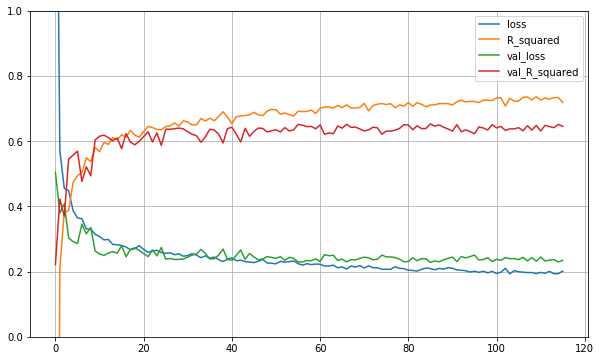

In [23]:
pd.DataFrame(history.history).plot(ylim=(0, 1), grid=True, figsize=(10,6))

## Performance

In [24]:
import tf_r2

DNN_r2 = dict(
    Train=tf_r2.R_squared(
        y_train, model.predict(X_train_scaled).flatten()
        ).numpy(),
    Test=tf_r2.R_squared(
        y_test, model.predict(X_test_scaled).flatten()
        ).numpy()
    )

pd.DataFrame([OLS_r2, DNN_r2], index=['OLS R2', 'DNN R2'])

,Train,Test
OLS R2,0.629655,0.597670
DNN R2,0.761559,0.664919


## Valuate listings

In [25]:
dnn_predicted = model.predict(scaler.transform(fix_reviews)).flatten()
overpriced = targets-dnn_predicted
mapairbnb.plot(data, features, color_by=overpriced, color_title='Diff log price')

## Location, location, location, again!



In [26]:
location_predicted = model.predict(scaler.transform(location_only)).flatten()

mapairbnb.plot(data, features, color_by=np.exp(location_predicted),
               color_title='Predicted price', zoom=8, hover=False)

Still a faliure but at least it's not linear anymore.

# Insight from gradients

Real easy to compute derivatives in TF2
* Define inputs as TF variables
* Do TF calculations under a `with tf.GradientTape() as tape:`
* Call `tape.gradient(outputs, inputs)`

Use `model()` instead of `model.predict()`

In [27]:
import tensorflow as tf

X = tf.Variable(features.values, dtype='float32')

with tf.GradientTape() as tape:
    X_std = (X-scaler.mean_) / scaler.scale_
    predictions = model(X_std)   # model.predict() is for non-TF inputs

dnn_coefs = tape.gradient(predictions, X).numpy()

dnn_coefs = pd.DataFrame(dnn_coefs,
                         columns=features.columns,
                         index=features.index)
dnn_coefs.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Hotel room,Shared room
0,-0.096714,0.015101,0.014431,0.072937,0.024630,0.057972,-0.005033,0.000207,0.000333,-0.017185,0.001029,-0.002105,0.000559,0.412691,-1.298518,-0.751042
1,-0.280435,-0.091802,0.066027,-0.034047,0.031476,0.022489,-0.019066,0.000393,-0.001252,-0.104983,-0.007778,-0.000385,-0.000581,0.362885,-1.362282,-0.245549
2,-0.255051,0.035718,0.039652,0.065761,-0.010541,0.009285,-0.007757,0.000230,-0.000237,-0.067688,-0.013348,0.000414,-0.000287,0.361740,-0.854089,-0.696978
3,0.713180,-0.064653,0.088121,0.222694,0.215169,0.142436,-0.015387,0.001337,-0.000710,-0.158898,0.019855,0.015509,0.000997,0.297758,-1.828120,-0.325078
4,0.538611,-0.243556,0.072970,0.404034,0.250076,0.022603,-0.018893,0.000109,-0.000985,-0.051532,-0.020593,0.012844,-0.000806,0.689859,-3.261869,-1.304748


## Compare with OLS
* Coefficients are different for every observation 
* Avarage is still comparable to OLS

In [28]:
ols_coef = pd.Series(results.params[1::], name='OLS_coef')

dnn_mean_coef = pd.Series(dnn_coefs.mean(axis=0),
                          index=features.columns,
                          name='DNN_mean_grad')

pd.DataFrame([ols_coef, dnn_mean_coef]).transpose()

,OLS_coef,DNN_mean_grad
latitude,0.013644,0.049740
longitude,0.165866,0.034917
accommodates,0.054204,0.058392
bathrooms,0.187950,0.162770
bedrooms,0.085331,0.045326
beds,0.000522,0.035428
minimum_nights,-0.005671,-0.012558
days_since_last_review,0.000826,0.000738
number_of_reviews,-0.000035,-0.000687
reviews_per_month,-0.050405,-0.089280


## Variable Importance
For each observation we can estimate the importance of each variable by multiplying the coefficients by the deviation of inputs from their mean.

In [29]:
abs_effect = (dnn_coefs * (features-features.mean())).abs()

# Compute per-row sum and reshape it to a vertical vector
abs_effect_sum = np.reshape(abs_effect.sum(axis=1).values, (len(features), 1))

# Divide by the sum so that effects sum to 1
per_obs_importance = abs_effect / abs_effect_sum

per_obs_importance.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Hotel room,Shared room
0,0.004816,0.000730,0.002117,0.074286,0.052417,0.217837,0.032418,0.048109,0.144621,0.001005,0.011739,0.050896,0.051058,0.288288,0.011326,0.008337
1,0.015757,0.012698,0.005742,0.020557,0.002974,0.019598,0.046951,0.055150,0.208310,0.059001,0.063133,0.006494,0.133148,0.341828,0.007044,0.001616
2,0.030174,0.001536,0.132937,0.050706,0.001272,0.010333,0.024394,0.004180,0.053544,0.034515,0.115250,0.010348,0.084151,0.435164,0.005640,0.005857
3,0.035591,0.004616,0.126604,0.009051,0.148561,0.173640,0.020737,0.027274,0.005963,0.171515,0.073465,0.041072,0.088086,0.067481,0.005173,0.001171
4,0.015320,0.011490,0.049688,0.130887,0.169277,0.010569,0.011216,0.096497,0.016704,0.059782,0.089687,0.136148,0.035802,0.153278,0.009049,0.004607


Averaging across observations we have a measure of overall variable importance.

In [30]:
mean_abs_effect = per_obs_importance.mean().sort_values(ascending=False)

pd.DataFrame(
    mean_abs_effect/mean_abs_effect.sum(),
    columns=['Variable Importance'])

,Variable Importance
Entire home/apt,0.190765
accommodates,0.114991
bathrooms,0.095124
reviews_per_month,0.083856
days_since_last_review,0.076454
bedrooms,0.069353
availability_30,0.057753
beds,0.051707
calculated_host_listings_count,0.050999
availability_365,0.049789


## Prediction postmortem

* Use gradients to review prediction errors

In [31]:
%%writefile prediction_postmortem.py

import pandas as pd
import numpy as np


def table(predictions, targets, features, data, per_obs_importance, dnn_coefs,
          mean_abs_effect):

    pred = pd.Series(predictions.numpy().flatten(),
                     index=features.index,
                     name='pred')

    err = (pred - targets).sort_values()
    err.name = 'log pred - log price'

    error_analysis = (
        features.loc[err.index]
        .join(per_obs_importance.loc[err.index], rsuffix='_importance')
        .join(dnn_coefs.loc[err.index], rsuffix='_coef')
        )

    col = []
    for index in mean_abs_effect.index:
        col.append(index + '_importance')
        col.append(index + '_coef')
        col.append(index)
    col

    error_analysis = error_analysis.reindex(col, axis=1)
    error_analysis = (
        pd.DataFrame(data.name[err.index])
        .join('<a href="' + data.listing_url[err.index] + '">link</a>')
        .join(pred[err.index].apply(np.exp))
        .join(targets[err.index].apply(np.exp))
        .join(error_analysis)
        )

    return error_analysis


Overwriting prediction_postmortem.py


In [32]:
from IPython.display import HTML
import prediction_postmortem

postmortem = prediction_postmortem.table(
    predictions, targets, features, data, per_obs_importance, dnn_coefs,
    mean_abs_effect)

### Worst undershoots

In [33]:
HTML(postmortem.head().to_html(escape=False))

,name,listing_url,pred,price,Entire home/apt_importance,Entire home/apt_coef,Entire home/apt,accommodates_importance,accommodates_coef,accommodates,bathrooms_importance,bathrooms_coef,bathrooms,reviews_per_month_importance,reviews_per_month_coef,reviews_per_month,days_since_last_review_importance,days_since_last_review_coef,days_since_last_review,bedrooms_importance,bedrooms_coef,bedrooms,availability_30_importance,availability_30_coef,availability_30,beds_importance,beds_coef,beds,calculated_host_listings_count_importance,calculated_host_listings_count_coef,calculated_host_listings_count,availability_365_importance,availability_365_coef,availability_365,number_of_reviews_importance,number_of_reviews_coef,number_of_reviews,latitude_importance,latitude_coef,latitude,longitude_importance,longitude_coef,longitude,minimum_nights_importance,minimum_nights_coef,minimum_nights,Hotel room_importance,Hotel room_coef,Hotel room,Shared room_importance,Shared room_coef,Shared room
2606,Private Room in South Minneapolis,link,83.958900,1451.0,0.137941,0.394475,0,0.227381,0.153849,2,0.003102,0.013838,1.0,0.209925,-0.292751,0.36,0.023493,0.000504,252.0,0.004704,-0.010044,1.0,0.052138,0.009928,25,0.073978,0.089462,1.0,0.001878,0.000623,1,0.076366,-0.000908,360,0.104210,-0.005700,7,0.012288,-0.486207,44.93689,0.012164,0.666153,-93.29148,0.053443,-0.037701,1,0.005564,-2.898683,0,0.001425,0.583469,0
3495,NE Mpls. Charmer,link,50.119892,801.0,0.442101,0.490903,0,0.126384,0.033203,2,0.092104,0.128054,2.0,0.008442,-0.003472,3.66,0.087448,0.000584,44.0,0.035886,0.029752,1.0,0.030115,0.005241,19,0.019428,0.009122,1.0,0.055230,-0.008544,2,0.002177,0.000022,116,0.073133,0.000978,101,0.002416,-0.106275,45.00463,0.003034,0.150228,-93.23963,0.021307,-0.005836,1,0.000368,-0.074442,0,0.000427,0.067872,0
3152,Minneapolis condo with view of Powderhorn Lake,link,81.761017,976.0,0.229358,0.710094,1,0.149551,0.073037,3,0.092417,0.196245,1.0,0.059323,-0.051194,2.88,0.055081,0.000551,65.0,0.096732,0.098302,1.0,0.000718,0.000103,8,0.147944,0.085151,1.0,0.002495,0.000394,1,0.105015,-0.000680,339,0.014294,-0.000379,79,0.012629,-0.260499,44.94126,0.002214,0.524398,-93.25920,0.022825,-0.011883,2,0.009202,-2.281816,0,0.000202,0.039331,0
4258,Private Capitol-View Retreat in Vibrant Lowertown,link,335.939240,3501.0,0.117555,0.529419,1,0.239181,0.046565,12,0.408965,0.273724,3.5,0.015144,-0.030380,2.47,0.047319,0.000641,58.0,0.013068,0.016802,3.0,0.011254,-0.002083,22,0.025833,-0.006631,8.0,0.028437,0.006534,1,0.042134,-0.000433,59,0.015207,-0.000965,65,0.000702,0.026988,44.95133,0.020294,0.172074,-93.09301,0.003232,-0.005448,3,0.006237,-2.249822,0,0.005437,-1.540991,0
2390,Lena's Lake Home In The City,link,366.792755,3401.0,0.009121,-0.042291,1,0.068049,-0.019027,10,0.006933,0.179239,1.5,0.089345,-0.212821,1.19,0.040851,0.001502,198.0,0.389386,0.179613,5.0,0.068875,-0.006694,0,0.117870,0.070799,5.0,0.041670,-0.009857,1,0.070261,0.001025,290,0.000021,-0.000001,14,0.012012,-0.489985,44.95238,0.057215,-0.577911,-93.39539,0.007400,-0.012842,3,0.009025,-3.351679,0,0.011966,-3.491666,0


### Worst overshoots

In [34]:
HTML(postmortem.tail().to_html(escape=False))

,name,listing_url,pred,price,Entire home/apt_importance,Entire home/apt_coef,Entire home/apt,accommodates_importance,accommodates_coef,accommodates,bathrooms_importance,bathrooms_coef,bathrooms,reviews_per_month_importance,reviews_per_month_coef,reviews_per_month,days_since_last_review_importance,days_since_last_review_coef,days_since_last_review,bedrooms_importance,bedrooms_coef,bedrooms,availability_30_importance,availability_30_coef,availability_30,beds_importance,beds_coef,beds,calculated_host_listings_count_importance,calculated_host_listings_count_coef,calculated_host_listings_count,availability_365_importance,availability_365_coef,availability_365,number_of_reviews_importance,number_of_reviews_coef,number_of_reviews,latitude_importance,latitude_coef,latitude,longitude_importance,longitude_coef,longitude,minimum_nights_importance,minimum_nights_coef,minimum_nights,Hotel room_importance,Hotel room_coef,Hotel room,Shared room_importance,Shared room_coef,Shared room
4034,Family Home Close To Downtown,link,303.408264,86.0,0.062468,0.389741,1,0.003388,0.100658,5,0.009147,0.318221,1.5,0.303390,-0.331356,0.04,0.014012,-0.000039,837.0,0.005873,-0.160596,2.0,0.239044,0.033908,28,0.087583,0.101584,1.0,0.017554,0.005587,1,0.098840,-0.001107,363,0.097354,-0.004383,1,0.001182,-0.989232,44.98937,0.011088,0.408190,-93.30696,0.031420,-0.032965,2,0.011127,-5.560083,0,0.006530,2.563706,0
4859,Hummingbird House,link,296.844696,69.0,0.094187,0.664458,1,0.121766,-0.028941,14,0.312735,0.263715,4.0,0.039879,-0.084596,2.80,0.098388,0.001457,14.0,0.232663,0.163284,5.0,0.011213,-0.002525,5,0.034031,0.054011,4.0,0.001173,-0.000422,1,0.009244,0.000252,272,0.001636,0.000527,50,0.010074,0.219513,44.88823,0.016656,-0.112946,-93.57290,0.004310,-0.005113,2,0.005253,-2.967772,0,0.006793,-3.015527,0
5691,Private and spacious room in Minneapolis,link,52.694668,11.0,0.159719,0.360777,0,0.275809,0.147402,2,0.047112,-0.166025,1.0,0.174776,-0.179890,0.26,0.014932,0.000578,200.0,0.018171,0.030645,1.0,0.109586,0.011803,0,0.094687,0.090445,1.0,0.011260,-0.017923,6,0.009103,0.000238,133,0.044315,-0.001683,2,0.001825,-0.070114,44.94625,0.000668,0.738935,-93.25379,0.029638,-0.025609,2,0.002541,-1.045603,0,0.005858,1.894206,0
39,Charlie Chaplin at The Outing Lodge,link,585.386597,101.0,0.005864,-0.023044,0,0.334628,0.082560,16,0.028606,0.175388,1.0,0.126869,-0.196280,0.02,0.030031,0.000057,1599.0,0.007209,-0.021152,1.0,0.175364,0.033171,29,0.011863,0.019714,1.0,0.023219,-0.015902,3,0.078356,-0.001265,362,0.085186,-0.005495,1,0.006204,-0.128399,45.11900,0.067279,0.451381,-92.84833,0.009374,-0.031360,3,0.005456,-3.906341,0,0.004492,2.526827,0
1049,"Artful & Inviting Historic Home, walk to Main St",link,158.528244,11.0,0.207452,0.554809,1,0.071402,0.054799,6,0.031211,0.465424,1.5,0.208644,-0.176680,0.82,0.017873,0.000335,203.0,0.019931,-0.015217,3.0,0.001948,-0.000118,28,0.025473,-0.015326,4.0,0.029967,-0.004089,1,0.059456,-0.000317,346,0.050914,-0.002904,29,0.011230,0.173606,45.03992,0.172885,-0.309419,-92.79889,0.059397,-0.026712,2,0.027703,-5.933800,0,0.004514,-0.759734,0


## Explore non-linearity
* Plot coefficients on own variable value

In [35]:
%%writefile plotcoefs.py
import matplotlib.pyplot as plt
import matplotlib


def plot_coefs_by_self(features, coefs, ols_results):
    
    matplotlib.rcParams.update({'font.size': 16})
    plt.style.use('seaborn-whitegrid')

    for i, field in enumerate(features.columns):
        
        plt.figure(figsize=(10, 6))

        plt.scatter(
            x=features[field],
            y=coefs[field],
            alpha=0.2)

        plt.plot([features.min()[field], features.max()[field]],
                 [0, 0], '--', color='grey')

        # OLS coef
        plt.plot([features.min()[field], features.max()[field]],
                 [ols_results.params[field], ols_results.params[field]],
                 ':',
                 color='black'
                 )

        # OLS confidence intervals
        plt.fill_between(
            [features.min()[field], features.max()[field]],
            [ols_results.conf_int().loc[field, 0],
             ols_results.conf_int().loc[field, 0]],
            [ols_results.conf_int().loc[field, 1],
             ols_results.conf_int().loc[field, 1]],
            color='gray', alpha=0.2)
        
        
        plt.ylim([coefs[field].min(), coefs[field].max()])
        plt.xlabel(field)
        plt.ylabel(field + ' coef')
        plt.legend(['Zero', 'OLS coef and 95% conf'])
        plt.show()


Overwriting plotcoefs.py


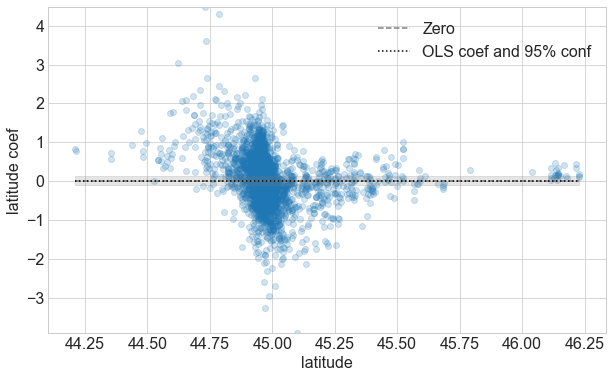

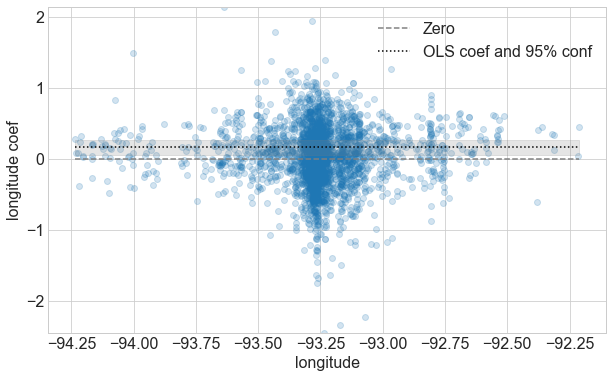

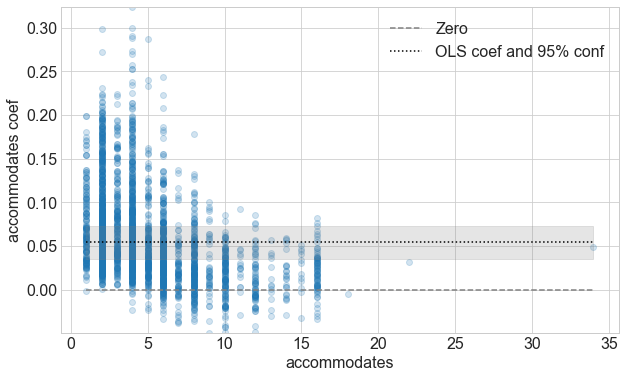

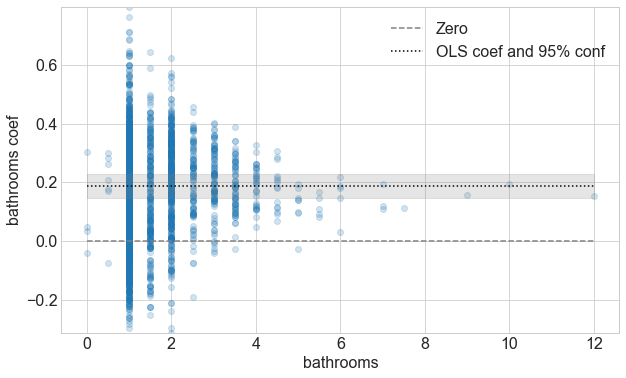

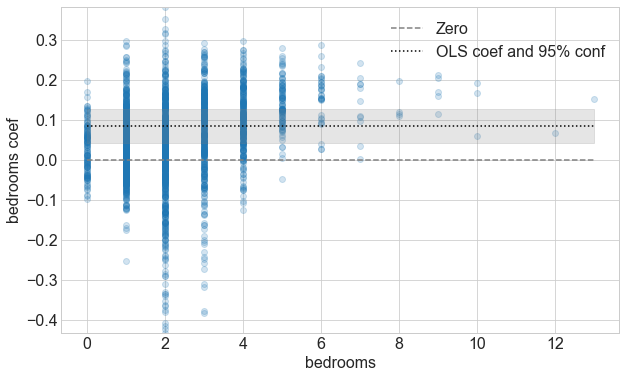

...

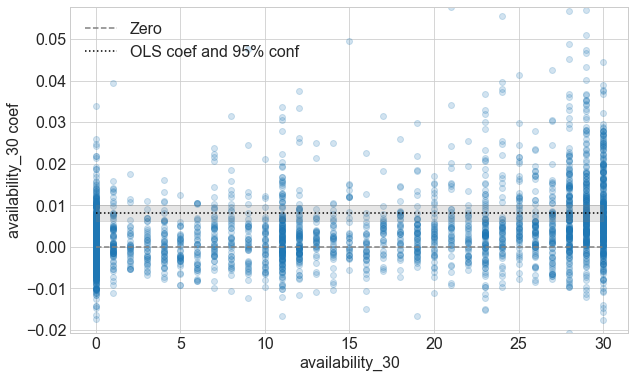

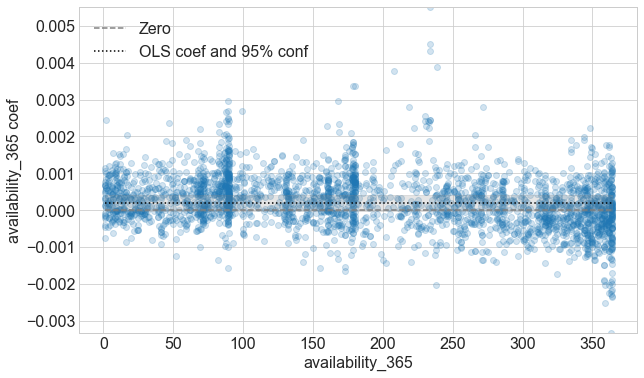

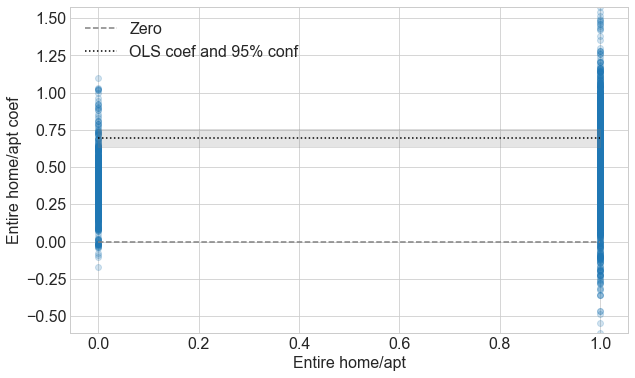

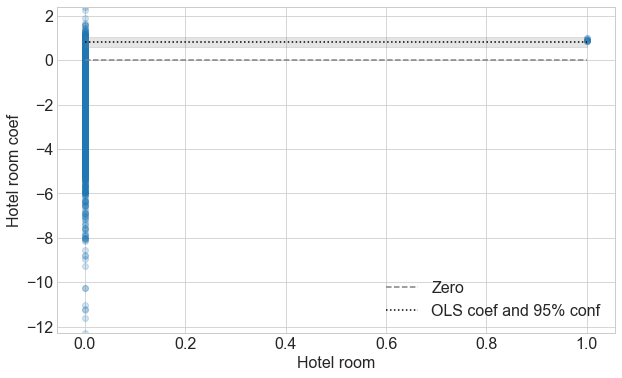

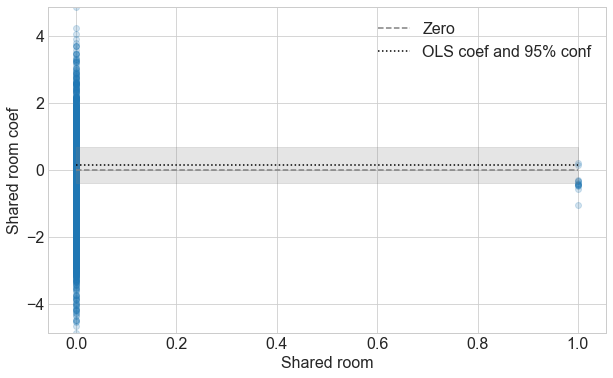

In [36]:
import plotcoefs

plotcoefs.plot_coefs_by_self(features, dnn_coefs, results)

## Location gradiants
* Location coefficients norm is a measure of effect of location on price

In [37]:
location_sensitivity = dnn_coefs[['latitude', 'longitude']].apply(
    np.linalg.norm, axis=1)

mapairbnb.plot(data, features, color_by=location_sensitivity,
               color_title='location sensitivity', hover=False)

* We see listings that are very sensitive mixed among ones that are not. 
* So location sensitivity must be driven by features other than location itself.

### location valuations
* We have to fix a listing to vary over loaction
* Focus on listings with high location sensitivity

In [38]:
location_sensitivity.name = 'loc_sens'
with_loc_sens = features.join(location_sensitivity).sort_values(by='loc_sens')

# Pick a few listings from the high end of the sensitivity sort
# and use them to get a location valuation plot
for p in np.linspace(0.9, 1, 5):

    i = int(p * (len(features)-1))

    fixed_app = with_loc_sens.iloc[i, :].drop('loc_sens')
    print(with_loc_sens.iloc[i, :].drop(['latitude', 'longitude']))

    location_only = fixcolumns.fix(data=features,
                                   fix_columns=features.columns[2:],
                                   fix_on=fixed_app.values)

    location_predicted = model.predict(
        scaler.transform(location_only)).flatten()

    mapairbnb.plot(data, features, color_by=np.exp(location_predicted),
                   color_title='Predicted price', hover=False, zoom=8).show()

accommodates                         6.000000
bathrooms                            3.500000
bedrooms                             4.000000
beds                                 4.000000
minimum_nights                       2.000000
days_since_last_review            1016.000000
number_of_reviews                    9.000000
reviews_per_month                    0.200000
calculated_host_listings_count       1.000000
availability_30                      0.000000
availability_365                   101.000000
Entire home/apt                      1.000000
Hotel room                           0.000000
Shared room                          0.000000
loc_sens                             1.232631
Name: 848, dtype: float64


accommodates                        7.000000
bathrooms                           1.000000
bedrooms                            3.000000
beds                                3.000000
minimum_nights                      1.000000
days_since_last_review            132.000000
number_of_reviews                   4.000000
reviews_per_month                   0.700000
calculated_host_listings_count      1.000000
availability_30                    29.000000
availability_365                  108.000000
Entire home/apt                     1.000000
Hotel room                          0.000000
Shared room                         0.000000
loc_sens                            1.373632
Name: 3727, dtype: float64


accommodates                        6.000000
bathrooms                           1.000000
bedrooms                            2.000000
beds                                3.000000
minimum_nights                      2.000000
days_since_last_review            156.000000
number_of_reviews                   7.000000
reviews_per_month                   0.560000
calculated_host_listings_count     13.000000
availability_30                    21.000000
availability_365                  339.000000
Entire home/apt                     1.000000
Hotel room                          0.000000
Shared room                         0.000000
loc_sens                            1.515692
Name: 5089, dtype: float64


accommodates                        6.000000
bathrooms                           1.000000
bedrooms                            1.000000
beds                                3.000000
minimum_nights                      1.000000
days_since_last_review             56.000000
number_of_reviews                  13.000000
reviews_per_month                   1.690000
calculated_host_listings_count     10.000000
availability_30                    12.000000
availability_365                  347.000000
Entire home/apt                     1.000000
Hotel room                          0.000000
Shared room                         0.000000
loc_sens                            1.829897
Name: 5868, dtype: float64


accommodates                        2.000000
bathrooms                           1.000000
bedrooms                            1.000000
beds                                1.000000
minimum_nights                      3.000000
days_since_last_review            827.000000
number_of_reviews                   1.000000
reviews_per_month                   0.040000
calculated_host_listings_count      1.000000
availability_30                    29.000000
availability_365                  179.000000
Entire home/apt                     1.000000
Hotel room                          0.000000
Shared room                         0.000000
loc_sens                            4.482076
Name: 2557, dtype: float64


* Maps for high location sensitivity listings are generally better. 
* Can we do any better still?

# A vertically partitioned network
* Location should not interact with other features
* Build a model where location is not allowed to interact with anything else
 

In [39]:
%%writefile loc_dnn.py
import tensorflow.keras as keras
from tf_r2 import R_squared


def build_model(
        input_shape,
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2,
        optimizer=keras.optimizers.SGD(0.05)):

    inputs = keras.Input(shape=input_shape)

    # Seperate the location on the first two indexes from the rest of
    # the inputs.
    loc = inputs[:, :2]
    for i in range(n_hidden):
        loc = keras.layers.Dense(width, activation=activation)(loc)
        loc = keras.layers.Dropout(dropout)(loc)
    loc = keras.layers.Dense(1)(loc)

    rest = inputs[:, 2:]
    for i in range(n_hidden):
        rest = keras.layers.Dense(width, activation=activation)(rest)
        rest = keras.layers.Dropout(dropout)(rest)
    rest = keras.layers.Dense(1)(rest)

    # Sum the two outputs so that they both have log price units.
    output = loc + rest

    loc_model = keras.Model(inputs=inputs, outputs=loc)
    full_model = keras.Model(inputs=inputs, outputs=output)

    full_model.compile(loss='mse',
                       optimizer=optimizer,
                       metrics=[R_squared])

    return full_model, loc_model


Overwriting loc_dnn.py


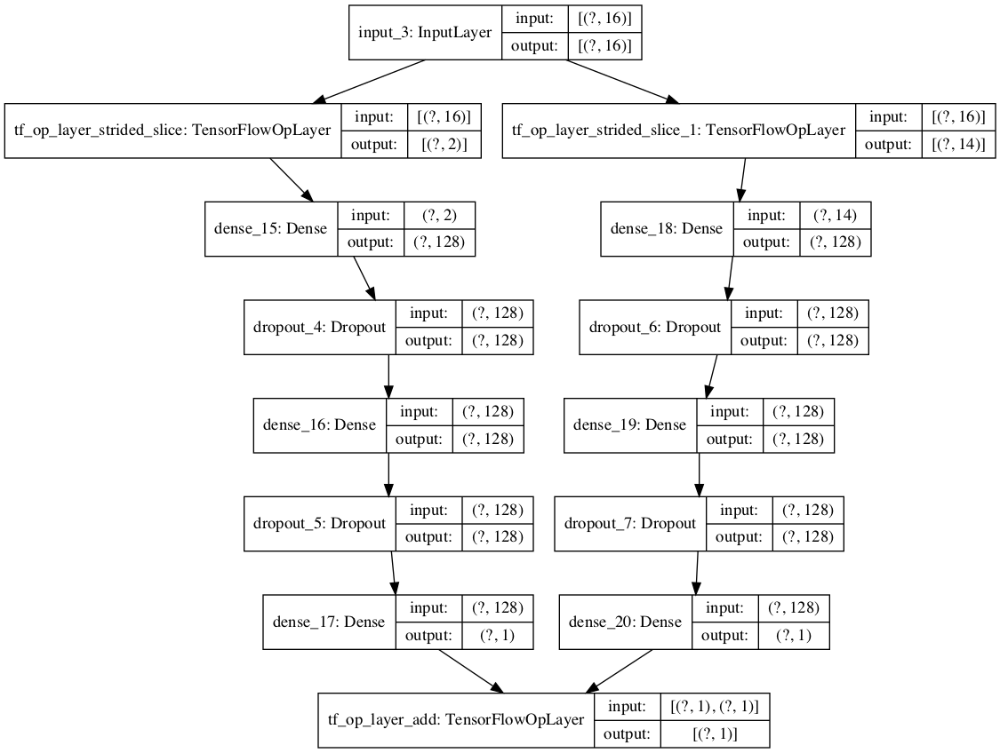

In [40]:
import loc_dnn
import tensorflow.keras as keras

model_all, loc_model = loc_dnn.build_model(X_train.shape[1:])

keras.utils.plot_model(model_all, show_shapes=True)

In [41]:
history = train_dnn.train(model_all, X_train_scaled, y_train, 
                          X_test_scaled, y_test)

Train on 2144 samples, validate on 704 samples
Epoch 1/1000
2144/2144 [==============================] - 1s 307us/sample - loss: 1.2657 - R_squared: -0.8453 - val_loss: 0.3510 - val_R_squared: 0.4677
Epoch 2/1000
2144/2144 [==============================] - 0s 68us/sample - loss: 0.4546 - R_squared: 0.3613 - val_loss: 0.2984 - val_R_squared: 0.5461
Epoch 3/1000
2144/2144 [==============================] - 0s 60us/sample - loss: 0.3848 - R_squared: 0.4605 - val_loss: 0.2996 - val_R_squared: 0.5503
Epoch 4/1000
2144/2144 [==============================] - 0s 62us/sample - loss: 0.3411 - R_squared: 0.5262 - val_loss: 0.2962 - val_R_squared: 0.5556
Epoch 5/1000
2144/2144 [==============================] - 0s 65us/sample - loss: 0.3424 - R_squared: 0.5397 - val_loss: 0.2612 - val_R_squared: 0.6044
Epoch 6/1000
2144/2144 [==============================] - 0s 72us/sample - loss: 0.3308 - R_squared: 0.5488 - val_loss: 0.2446 - val_R_squared: 0.6263
Epoch 7/1000
2144/2144 [=====================

2144/2144 [==============================] - 0s 57us/sample - loss: 0.2221 - R_squared: 0.6966 - val_loss: 0.2266 - val_R_squared: 0.6545
Epoch 55/1000
2144/2144 [==============================] - 0s 53us/sample - loss: 0.2186 - R_squared: 0.6934 - val_loss: 0.2243 - val_R_squared: 0.6574
Epoch 56/1000
2144/2144 [==============================] - 0s 56us/sample - loss: 0.2187 - R_squared: 0.6932 - val_loss: 0.2413 - val_R_squared: 0.6352
Epoch 57/1000
2144/2144 [==============================] - 0s 64us/sample - loss: 0.2243 - R_squared: 0.6970 - val_loss: 0.2281 - val_R_squared: 0.6542
Epoch 58/1000
2144/2144 [==============================] - 0s 59us/sample - loss: 0.2157 - R_squared: 0.7014 - val_loss: 0.2404 - val_R_squared: 0.6371
Epoch 59/1000
2144/2144 [==============================] - 0s 50us/sample - loss: 0.2195 - R_squared: 0.6901 - val_loss: 0.2464 - val_R_squared: 0.6279
Epoch 60/1000
2144/2144 [==============================] - 0s 61us/sample - loss: 0.2195 - R_squared: 

Epoch 108/1000
2144/2144 [==============================] - 0s 50us/sample - loss: 0.1944 - R_squared: 0.7269 - val_loss: 0.2202 - val_R_squared: 0.6609
Epoch 109/1000
2144/2144 [==============================] - 0s 64us/sample - loss: 0.1954 - R_squared: 0.7273 - val_loss: 0.2272 - val_R_squared: 0.6546
Epoch 110/1000
2144/2144 [==============================] - 0s 71us/sample - loss: 0.1993 - R_squared: 0.7267 - val_loss: 0.2225 - val_R_squared: 0.6606
Epoch 111/1000
2144/2144 [==============================] - 0s 71us/sample - loss: 0.2006 - R_squared: 0.7247 - val_loss: 0.2210 - val_R_squared: 0.6632
Epoch 112/1000
2144/2144 [==============================] - 0s 69us/sample - loss: 0.1991 - R_squared: 0.7181 - val_loss: 0.2171 - val_R_squared: 0.6672
Epoch 113/1000
2144/2144 [==============================] - 0s 67us/sample - loss: 0.1972 - R_squared: 0.7245 - val_loss: 0.2176 - val_R_squared: 0.6646
Epoch 114/1000
2144/2144 [==============================] - 0s 66us/sample - loss:

2144/2144 [==============================] - 0s 50us/sample - loss: 0.1853 - R_squared: 0.7538 - val_loss: 0.2172 - val_R_squared: 0.6649
Epoch 162/1000
2144/2144 [==============================] - 0s 60us/sample - loss: 0.1863 - R_squared: 0.7301 - val_loss: 0.2195 - val_R_squared: 0.6606
Epoch 163/1000
2144/2144 [==============================] - 0s 63us/sample - loss: 0.1863 - R_squared: 0.7371 - val_loss: 0.2201 - val_R_squared: 0.6623
Epoch 164/1000
2144/2144 [==============================] - 0s 65us/sample - loss: 0.1852 - R_squared: 0.7462 - val_loss: 0.2194 - val_R_squared: 0.6644
Epoch 165/1000
2144/2144 [==============================] - 0s 56us/sample - loss: 0.1842 - R_squared: 0.7466 - val_loss: 0.2207 - val_R_squared: 0.6629
Epoch 166/1000
2144/2144 [==============================] - 0s 56us/sample - loss: 0.1844 - R_squared: 0.7548 - val_loss: 0.2335 - val_R_squared: 0.6448
Epoch 167/1000
2144/2144 [==============================] - 0s 53us/sample - loss: 0.1869 - R_squ

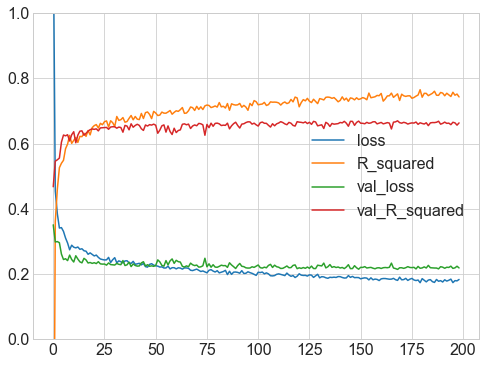

In [42]:
pd.DataFrame(history.history).plot(ylim=(0, 1), grid=True, figsize=(8, 6))

## Performance

In [43]:
loc_DNN_r2 = dict(
    Train=tf_r2.R_squared(
        y_train, model_all.predict(X_train_scaled).flatten()).numpy(),
    Test=tf_r2.R_squared(
        y_test, model_all.predict(X_test_scaled).flatten()).numpy())

pd.DataFrame([OLS_r2, DNN_r2, loc_DNN_r2], index=['OLS R2', 'DNN R2',
                                                  'loc DNN R2'])

,Train,Test
OLS R2,0.629655,0.597670
DNN R2,0.761559,0.664919
loc DNN R2,0.787570,0.684835


Nice improvement!

## Valuate location

In [44]:
location_predicted = loc_model.predict(scaler.transform(features)).flatten()

mapairbnb.plot(data, features, color_by=location_predicted,
               color_title='Diff log price', hover=False, zoom=8)

Finally, it's correct!